# Inżynieria cech i wstępne modelowanie

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import plotly.express as px
from sklearn.decomposition import PCA

from sklearn.metrics import davies_bouldin_score
from sklearn.metrics import silhouette_score
from sklearn.metrics import calinski_harabasz_score

import warnings
warnings.filterwarnings('ignore')

## Wczytanie danych

Sczytujemy nazwy kolumn:

In [2]:
col_names = pd.read_csv("UCI HAR Dataset/features.txt", delim_whitespace=True, header=None)[1]

Do występujących kolumn o zduplikowanych nazwach dodajemy odpowiednią numerację.

In [3]:
for i in range(42):
    col_names[302+i] += ["--1","--2","--3"][(i)//14]
    col_names[381+i] += ["--1","--2","--3"][(i)//14]
    col_names[460+i] += ["--1","--2","--3"][(i)//14]

In [4]:
X_train = pd.read_csv("UCI HAR Dataset/train/X_train.txt", delim_whitespace=True, header=None, names=col_names)

In [5]:
X_train 

,tBodyAcc-mean()-X,tBodyAcc-mean()-Y,tBodyAcc-mean()-Z,tBodyAcc-std()-X,tBodyAcc-std()-Y,tBodyAcc-std()-Z,tBodyAcc-mad()-X,tBodyAcc-mad()-Y,tBodyAcc-mad()-Z,tBodyAcc-max()-X,...,fBodyBodyGyroJerkMag-meanFreq(),fBodyBodyGyroJerkMag-skewness(),fBodyBodyGyroJerkMag-kurtosis(),"angle(tBodyAccMean,gravity)","angle(tBodyAccJerkMean),gravityMean)","angle(tBodyGyroMean,gravityMean)","angle(tBodyGyroJerkMean,gravityMean)","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)"
0,0.288585,-0.020294,-0.132905,-0.995279,-0.983111,-0.913526,-0.995112,-0.983185,-0.923527,-0.934724,...,-0.074323,-0.298676,-0.710304,-0.112754,0.030400,-0.464761,-0.018446,-0.841247,0.179941,-0.058627
1,0.278419,-0.016411,-0.123520,-0.998245,-0.975300,-0.960322,-0.998807,-0.974914,-0.957686,-0.943068,...,0.158075,-0.595051,-0.861499,0.053477,-0.007435,-0.732626,0.703511,-0.844788,0.180289,-0.054317
2,0.279653,-0.019467,-0.113462,-0.995380,-0.967187,-0.978944,-0.996520,-0.963668,-0.977469,-0.938692,...,0.414503,-0.390748,-0.760104,-0.118559,0.177899,0.100699,0.808529,-0.848933,0.180637,-0.049118
3,0.279174,-0.026201,-0.123283,-0.996091,-0.983403,-0.990675,-0.997099,-0.982750,-0.989302,-0.938692,...,0.404573,-0.117290,-0.482845,-0.036788,-0.012892,0.640011,-0.485366,-0.848649,0.181935,-0.047663
4,0.276629,-0.016570,-0.115362,-0.998139,-0.980817,-0.990482,-0.998321,-0.979672,-0.990441,-0.942469,...,0.087753,-0.351471,-0.699205,0.123320,0.122542,0.693578,-0.615971,-0.847865,0.185151,-0.043892
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7347,0.299665,-0.057193,-0.181233,-0.195387,0.039905,0.077078,-0.282301,0.043616,0.060410,0.210795,...,-0.070157,-0.588433,-0.880324,-0.190437,0.829718,0.206972,-0.425619,-0.791883,0.238604,0.049819
7348,0.273853,-0.007749,-0.147468,-0.235309,0.004816,0.059280,-0.322552,-0.029456,0.080585,0.117440,...,0.165259,-0.390738,-0.680744,0.064907,0.875679,-0.879033,0.400219,-0.771840,0.252676,0.050053
7349,0.273387,-0.017011,-0.045022,-0.218218,-0.103822,0.274533,-0.304515,-0.098913,0.332584,0.043999,...,0.195034,0.025145,-0.304029,0.052806,-0.266724,0.864404,0.701169,-0.779133,0.249145,0.040811
7350,0.289654,-0.018843,-0.158281,-0.219139,-0.111412,0.268893,-0.310487,-0.068200,0.319473,0.101702,...,0.013865,0.063907,-0.344314,-0.101360,0.700740,0.936674,-0.589479,-0.785181,0.246432,0.025339


## Inżynieria cech

Bogatsi o doświadczenia z dokonanego EDA, przechodzimy do inżynierii cech. Wcześniej udało nam się pokazać wysoką korelację między zmiennymi w domenie czasu, a częstotliwości. Z tego powodu już na samym początku przed zastosowaniem PCA chcieliśmy dokonać redukcji wymiarów tylko do domeny częstotliwości. Jednak zbadanie zachowania się metryki silhouette_score dawało lepsze rezultaty, gdy PCA było na całości zbioru.

W celu zredukcji zbyt dużej liczby cech zdecydowaliśmy się na wspomnianą wcześniej metodę poznaną na laboratoriach - PCA. Aby dostosować odpowiednią ilość komponentów, tworzymy wykres obazujący ilość wyjaśnianej wariancji.

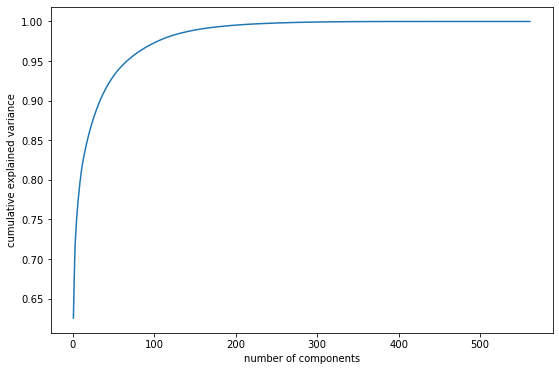

In [6]:
pca = PCA().fit(X_train)

plt.figure(figsize=(9,6))
plt.plot(range(1, len(pca.explained_variance_ratio_)+1), np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');

In [7]:
pca = PCA(n_components = 30)
data_30 = pca.fit_transform(X_train)

In [8]:
sum(pca.explained_variance_ratio_)

0.8906181079477306

Już dla 30 komponentów zauważamy, że wyjaśnione zostało ponad 89% wariancji. Uznajemy, że jest to w naszym przypadku wynik wystarczający i to na taką liczbę komponentów się decydujemy. Później wywoływaliśmy kod dla innej liczby komponentów np. 10, 50, 100, 200 jednak nie miało to bardzo dużego wpływu na uzyskiwaną jakość metryk, a wyniki nie były zbyt interesujące.

## Wstępne modelowanie

Na tym etapie istotnym jest dla nas znalezenie odpowiedniej liczby klastrów. W tym celu będziemy badać zachowanie metryki silhouette_score oraz calinski_harabasz_score.

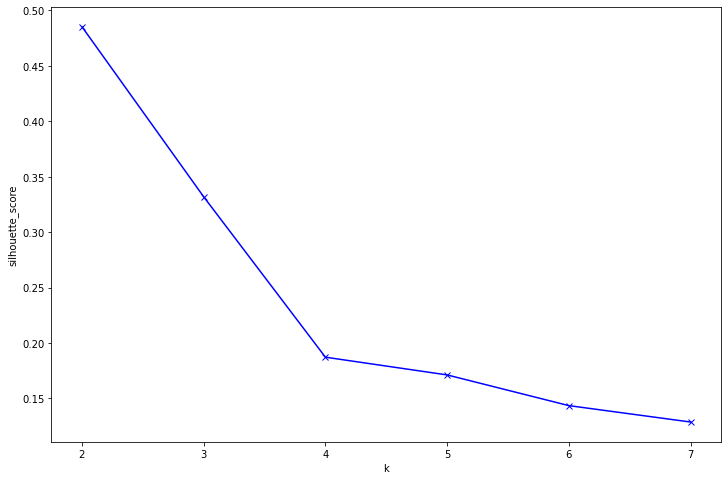

In [9]:

from sklearn.cluster import KMeans

data = data_30

wyniki = []

for k in range(2,8):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(data)
    score = silhouette_score(X_train, kmeans.predict(data))
    wyniki.append(score)

    

plt.figure(figsize=(12, 8))
plt.plot(range(2, 8), wyniki, 'bx-')
plt.xlabel('k')
plt.ylabel('silhouette_score')
plt.show()

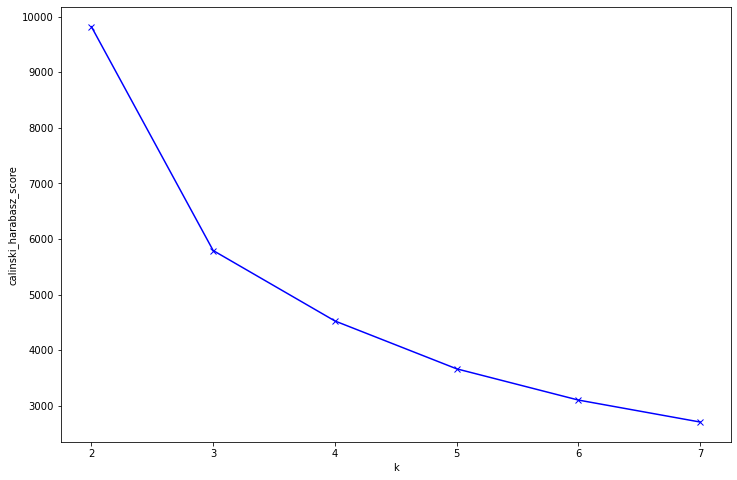

In [10]:
data = data_30

wyniki = []

for k in range(2,8):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(data)
    score = calinski_harabasz_score(X_train, kmeans.predict(data))
    wyniki.append(score)

    

plt.figure(figsize=(12, 8))
plt.plot(range(2, 8), wyniki, 'bx-')
plt.xlabel('k')
plt.ylabel('calinski_harabasz_score')
plt.show()

Jej zachowanie silhouette_score oraz calinski_harabasz_score jednoznacznie wskazywały, aby dokonać wyodrębnienie na 2 klastry. Istotnie dokonamy teraz tego podziału. Jesteśmy świadomi, że dane dotyczą rodzajów aktywności ludzi mierzonej przez smartfony. Narzuca się zatem wniosek, że być może bardzo łatwo jest odróźnić od siebie  aktywności, które polegają na przemieszczaniu się od tych statycznych.

Dokonajmy zatem tego podziału.

In [11]:
from sklearn.cluster import KMeans

clusterer = KMeans(n_clusters=2, random_state=42)
clusterer.fit(data_30)

KMeans(n_clusters=2, random_state=42)

In [12]:
cluster_0 = X_train.loc[clusterer.labels_ == 0]
cluster_1 = X_train.loc[clusterer.labels_ == 1]

In [13]:
len(cluster_0)

3297

In [14]:
len(cluster_1)

4055

Otrzymaliśmy dwa klastry podobnej liczności. Jeśli hipoteza odnośnie zachodzącego podziału jest prawdziwa, to dobrym pomysłem może być zbadanie, czy da się dokonać dalszego podziału w obrębie każdego z klastrów.

Zdecydowaliśmy się na zastosowanie teraz PCA ponownie w obrębie tych klastrów, przypuszczając, że inne cechy mogą lepiej teraz wyjaśniać wariancje osobno dla aktywności statycznych i dynaminczych.

In [15]:
pca = PCA(n_components = 30, random_state=42)
cluster_0_30 = pca.fit_transform(cluster_0)
cluster_1_30 = pca.fit_transform(cluster_1)

## Finalne modelowanie

Część notebooka do tego momentu bazuje głównie na doświadczeniach zebranych z pracą ze zbiorem w poprzednich tygodniach.

Gdy teraz testowaliśmy przeróżne modele, chciały (nie bez podstaw), dokonywać jedynie podziału na 2 klastry. Odseparowanie od siebie jedynie aktywności statycznych i dynamicznych nie jest jednak naszym zdaniem zadaniem ciekawym z punktu zadania klasteryzacji dla tego zbioru. 

Zatem plan działania jest następujący. 
- Najpierw ustalamy jakim modelem chcemy dokonywać kolejnych podziałów. 
- Badamy metryki, aby uzyskać na jaką liczbę klastrów chce on dzielić tym razem.
- Wizualizacja w 3 wymiarach na podstawie PCA - na podstawie tego będziemy wybierali m.in. model finalny
- Wyświetlamy wizualizację TSNE dla naszych labeli oraz oryginalnych + dodajemy confusion matrix. Mimo oglądania tych wyników przy wybieraniu modelu będziemy starali się tym nie kierować i robimy to jedynie w celu zdobycia dodatkowego doświadczenia i wiedzy, gdyż jednak jest to jedno z pierwszych naszych zadań klasteryzacji, więc może warto zobaczyć Confusion matrix dla każdego, a nie jedynie naszym zdaniem najlepszego modelu.


In [16]:
"""Funkcja wizualizuje rzeczy przy pomocy TSNE, robi to dla labeli przypisanych i oryginalnych oraz daje cofusion matrix"""

from IPython.display import display

def visulization_and_matrix(data):

    clusters5 = data # clusters5 to zaszlosc, ale nie zmieniamy na data dalej

    clusters5 = clusters5.sort_index()

    labels_TSNE = clusters5['Label']
    clusters5 = clusters5.drop(columns='Label')
    
    from sklearn.manifold import TSNE
    X_pca = PCA(n_components=40).fit_transform(clusters5)
    random_state = 1500100900
    clusters_proj = TSNE(random_state=random_state).fit_transform(X_pca)
    
    Y_train = pd.read_csv("UCI HAR Dataset/train/Y_train.txt", delim_whitespace=True, header=None)
    
    plt.figure(figsize=(16, 6))

    plt.subplot(1, 2, 1)
    plt.scatter(clusters_proj[:,0], clusters_proj[:,1], c=labels_TSNE)
    plt.title('Model labels')

    plt.subplot(1, 2, 2)
    plt.scatter(clusters_proj[:,0], clusters_proj[:,1], c=Y_train)
    plt.title('Original labels')

    plt.show()
    
    ###tu już confusion jest
    
    label_list = np.zeros(shape=(len(set(labels_TSNE)),6))
    for cur_label, og_label in zip(labels_TSNE, Y_train[0]):
        label_list[cur_label][og_label - 1] += 1 # zmiana cur_label-1
        
    label_df = pd.DataFrame(label_list)
    label_df.columns = ['WALKING', 'WALKING_UPSTAIRS', 'WALKING_DOWNSTAIRS', 'SITTING', 'STANDING', 'LAYING']
    display(label_df)

In [17]:
"""Wizualizacja zbiorow w 3d"""

def visualization_3d(labeled_data):
    
    X = labeled_data

    pca = PCA(n_components=3)
    X=X.sort_index()
    components = pca.fit_transform(X.loc[:, X.columns != 'Label'])

    total_var = pca.explained_variance_ratio_.sum() * 100

    fig = px.scatter_3d(
        components, x=0, y=1, z=2, color=X["Label"],
        title=f'Total Explained Variance: {total_var:.2f}% when using 3 dimensions',
        labels={'0': 'x', '1': 'y', '2': 'z'}
    )
    fig.show()

## Kmeans

### Liczba klastrów

Badamy metryczki ponownie obrębie klastrów ponownie

In [18]:
def metryki_KMeans(metryka, cluster_0, cluster_1, cluster_0_30, cluster_1_30):
    wyniki0 = []
    wyniki1 = []

    for k in range(2,8):
        kmeans = KMeans(n_clusters=k, random_state=42)
        kmeans.fit(cluster_0_30)
        score = metryka(cluster_0, kmeans.predict(cluster_0_30))
        wyniki0.append(score)
        kmeans = KMeans(n_clusters=k, random_state=42)
        kmeans.fit(cluster_1_30)
        score = metryka(cluster_1, kmeans.predict(cluster_1_30))
        wyniki1.append(score)

    

    plt.figure(figsize=(12, 8))
    plt.plot(range(2, 8), wyniki0, 'bx-', label='cluster_0')
    plt.plot(range(2, 8), wyniki1, 'go-', label='cluster_1')
    plt.xlabel('k')
    plt.ylabel('Wartość metryki')
    plt.legend(loc='upper right', fontsize=16)
    plt.show()

Wartość dla silhouette_score.

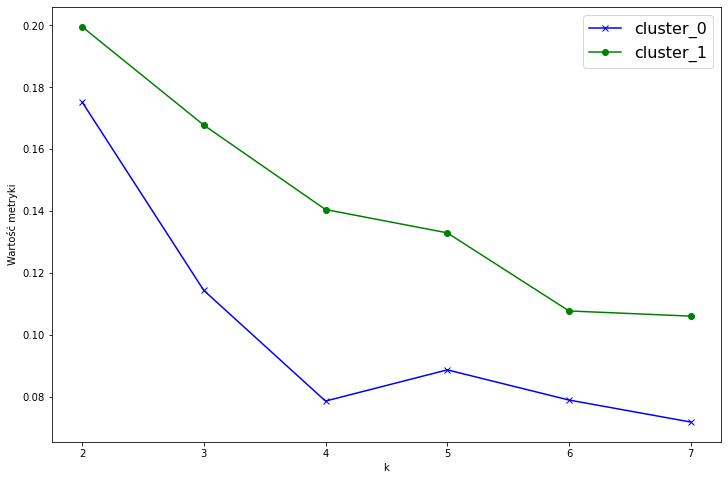

In [19]:
metryki_KMeans(silhouette_score, cluster_0, cluster_1, cluster_0_30, cluster_1_30)

Miara silhouette_score nadal pokazuje, aby dokonać dalszego podziału na 2 klastry. Widzimy jednak, że dla klastra zerowego podział na 3 jest niemal tak samo premiowany jak podział na 2 dla klastra pierwszego. 

Zbadamy zatem zachowanie davies_bouldin_score. Ta metryka, oparta o średnie podobieństwo każdego z klastrów do pewnego, który najbardziej go przypomina. Podobieństwo jest zdefiniowane jako stosunek odległości wewnątrz klastra do odległości między klastrami - im mniejszy wynik tym lepiej.

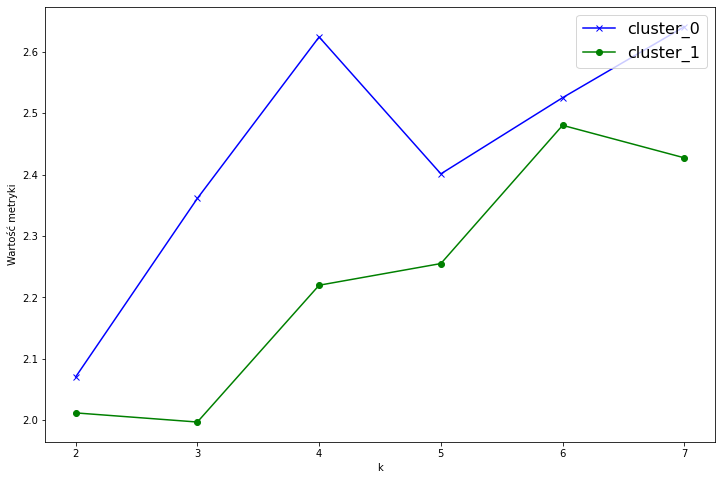

In [20]:
metryki_KMeans(davies_bouldin_score, cluster_0, cluster_1, cluster_0_30, cluster_1_30)

Z obawy na to, że miara silhouette_score może wykazywać pewną tendencyjność i jest jej ciężko wyodrębniać klastry dla tych danych więc dokonuje najmniej możliwie podziałów sugerujemy się metryką davies_bouldin_score i dokonujemy podziału na 2 i 3 w kolejnym kroku (odpowiednio klastra 0 i klastra 1).

### Etykietowanie

In [21]:
clusterer = KMeans(n_clusters=2, random_state=42)
clusterer.fit(cluster_0_30)

KMeans(n_clusters=2, random_state=42)

In [22]:
# dodawanie odpowiedniej etykiety
cluster_00 = cluster_0.loc[clusterer.labels_ == 0]
cluster_00['Label'] = 0
cluster_01 = cluster_0.loc[clusterer.labels_ == 1]
cluster_01['Label'] = 1

In [23]:
clusterer = KMeans(n_clusters=3, random_state=42)
clusterer.fit(cluster_1_30)

KMeans(n_clusters=3, random_state=42)

In [24]:
# dodawanie odpowiedniej etykiety
cluster_10 = cluster_1.loc[clusterer.labels_ == 0]
cluster_10['Label'] = 2
cluster_11 = cluster_1.loc[clusterer.labels_ == 1]
cluster_11['Label'] = 3
cluster_12 = cluster_1.loc[clusterer.labels_ == 2]
cluster_12['Label'] = 4

In [25]:
X_KMeans = cluster_00.append(cluster_01).append(cluster_10).append(cluster_11).append(cluster_12)

### Wizualizacje

In [26]:
visualization_3d(X_KMeans)

Z wizualizacji w trzech wymiarach, wnioskujemy, że dokonany podział ma sens i z dużym prawdopodobieństwem są to klastry porządane i do których ten projket powinien nas doprowadzić. Być może będzie to najlepszy optyczny podział, lecz zbadajmy jak poradzą sobie inne modele.

Najpierw jednak przeanalizujmy w porównianiu do orygianlnych etykiet.

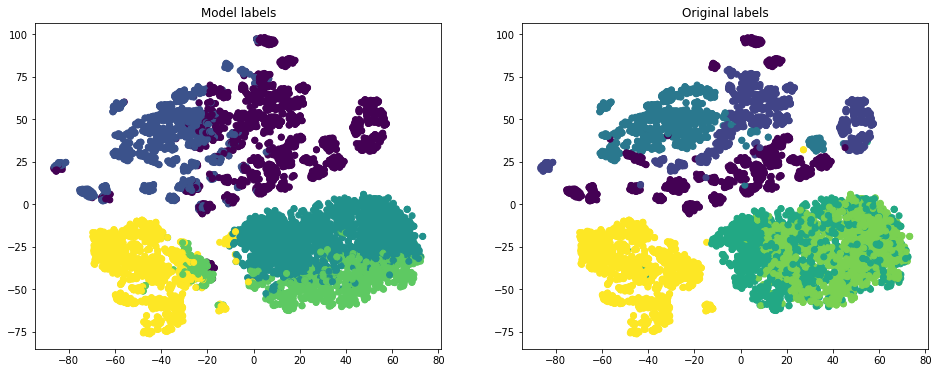

,WALKING,WALKING_UPSTAIRS,WALKING_DOWNSTAIRS,SITTING,STANDING,LAYING
0,853.0,914.0,259.0,1.0,0.0,11.0
1,373.0,159.0,727.0,0.0,0.0,0.0
2,0.0,0.0,0.0,914.0,935.0,0.0
3,0.0,0.0,0.0,321.0,439.0,157.0
4,0.0,0.0,0.0,50.0,0.0,1239.0


In [27]:
visulization_and_matrix(X_KMeans)

Z wykresów widzimy, że:
* żółty klaster, jest całkiem dobrze zdefiniowany
* w zbiorowisku kolorów zielonych, bardzo ciężko jest znaleźć wyróżniające cechy
* bazując również na wynikach z confusion matrix (patrz niżej), możemy wnioskować o podziale tego wykresu na dwie części, na górze mamy dynamiczne aktywności. Do pewnego scalenia się w jeden klaster doszło w obrębie WALKING i WALKING_UPSTAIRS. Co do aktywności statycznych: ogromne problemy sprawiło algorytmowi dokonanie podziału na aktywności SITTING i STANDING. Dosyć dobrze jest wyróżniane LAYING.

Głównie nasz początkowy podział na dwa klastry, czyli, na zbiorowiska klastrów o indeksach: 0, 1 i 2, 3, 4 spowodował podział na czynności dynamiczne i czynności statyczne. Potwierdza to więc naszą początkową intuicję o tych zbiorach. Następne klasteryzacje tych podgrup, nie przyniosły już tak idealnych wyników. Głównie, w zbiorowisku ruchomym, udało się oddzielić czynności WALKING_DOWNSTAIRS od WALKING + WALKING_UPSTAIRS. Natomiast w zbiorowisku statycznym, właściwie udało się tylko oddzielić prawie idealnie LAYING, ale SITTING i STANDING dalej pozostają wymieszane.

## AgglomerativeClustering

Teraz będziemy testowali klastrowanie przy użyciu AgglomerativeClustering. Będziemy testować każde z 4 zaproponowanych później połączeń, wybierając im jednak najpierw liczbę klastrów w oprciu o jakąś metrykę. Dobór metryki będzie się jednak odbywał za pomocą wyspecyfikowania liczby klastrów, nie wyboru odległości. Może mieć to pewne wady, ale dzięki temu możemy wybór zsynchronizować dla każdego typu łączenia, a nie robić to z osobna i jest szybciej. 

Zbadajmy metryki

### Liczba klastrów

In [28]:
from sklearn.metrics import silhouette_score
from sklearn.cluster import AgglomerativeClustering



def plot_agglomerative(cluster, cluster_30, score_fun):
    plt.figure(figsize=(12, 8))

    for linkage, col in zip(['ward', 'complete', 'average', 'single'],
                            ['green', 'blue', 'red', 'yellow']):
        wyniki = []
        for k in range(2, 8):
            model = AgglomerativeClustering(n_clusters=k, linkage=linkage)
            score = score_fun(cluster, model.fit_predict(cluster_30))
            wyniki.append(score)
        plt.plot(range(2, 8), wyniki, color=col, marker='x')
        
        


    plt.legend(['ward', 'complete', 'average', 'single'])
    plt.xlabel('k')
    plt.ylabel('Wartość metryki')
    plt.show()
    

#### Wybór dla cluster 0

Badamy kolejno 2 mertyki silhouette_score oraz davies_bouldin_score.

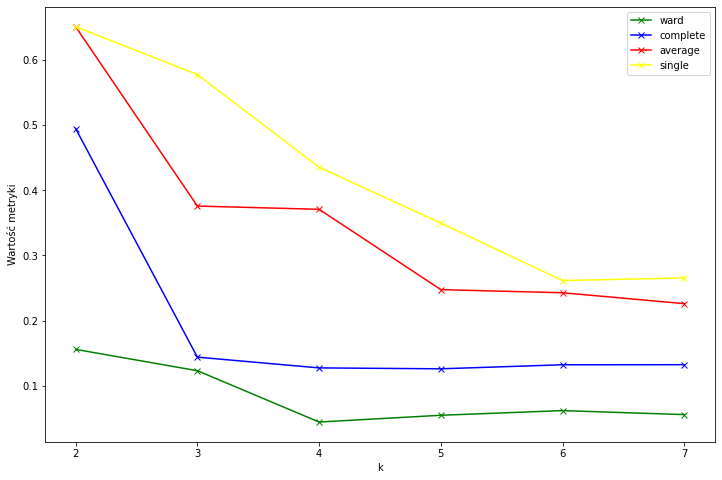

In [29]:
plot_agglomerative(cluster_0, cluster_0_30, silhouette_score)

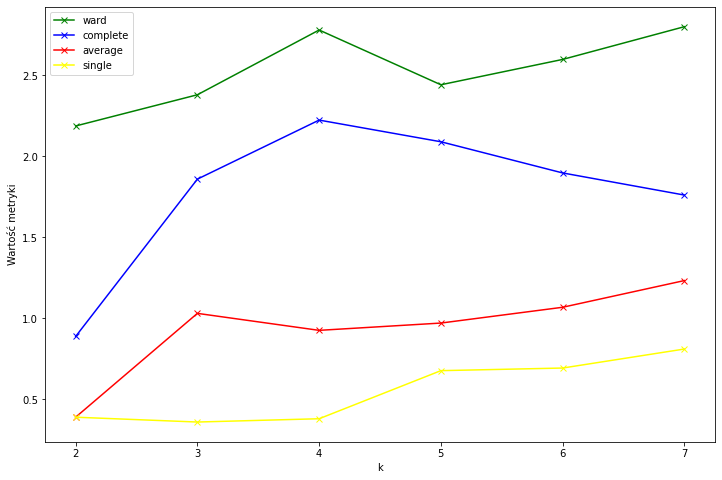

In [30]:
plot_agglomerative(cluster_0, cluster_0_30, davies_bouldin_score)

Wnioski: dla każdego algorytmu zastosujemy podział w tej cześci na 2 z wyjątkiem single, gdzie podzielimy na 3. Chcemy sprawdzić wyodrębnianie się większej liczby klastrów niż w poprzednim kamieniu milowym.

#### Wybór dla cluster 1

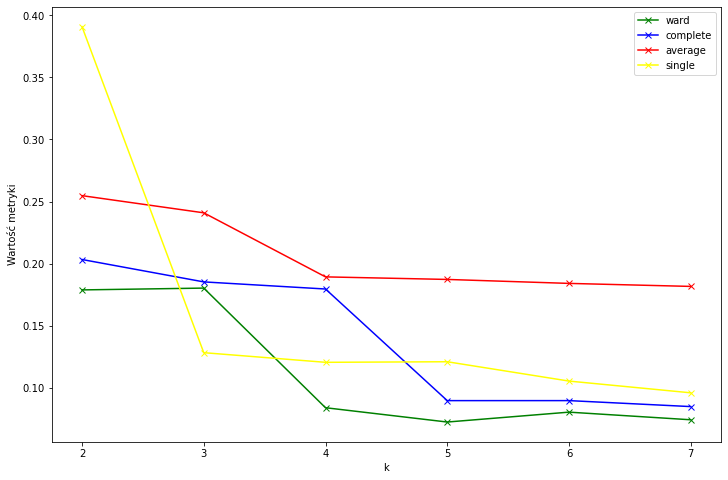

In [31]:
plot_agglomerative(cluster_1, cluster_1_30, silhouette_score)

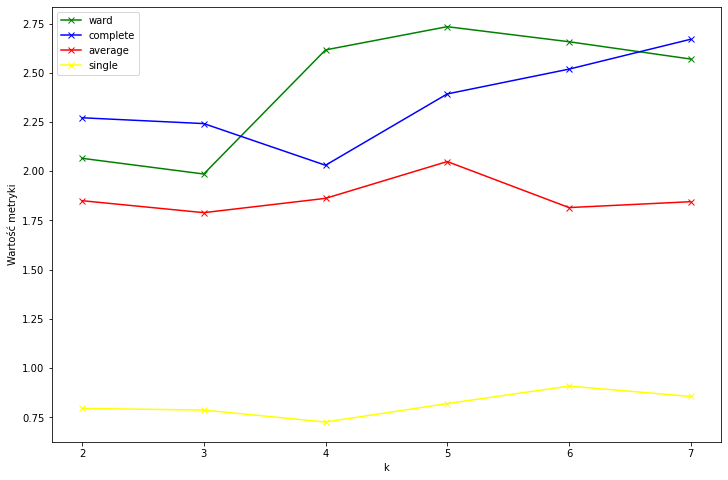

In [32]:
plot_agglomerative(cluster_1, cluster_1_30, davies_bouldin_score)

Tutaj zastosujemy podział dla warda i average na 3, a single i complete na 2.

### Etykietowanie

In [33]:
def etykietuj_algomeracyjnie(liczba_klastrow_cluster_0, liczba_klastrow_cluster_1, linkage):

    model = AgglomerativeClustering(n_clusters = liczba_klastrow_cluster_0, linkage=linkage)
    model.fit(cluster_0_30)
    shift_size = len(set(model.labels_))

    cluster_0_labeled = cluster_0
    cluster_0_labeled['Label'] = model.labels_

    model = AgglomerativeClustering(n_clusters= liczba_klastrow_cluster_1, linkage=linkage)
    model.fit(cluster_1_30)

    cluster_1_labeled = cluster_1
    cluster_1_labeled['Label'] = model.labels_ + shift_size
    
    return cluster_0_labeled.append(cluster_1_labeled)


In [34]:
X_average = etykietuj_algomeracyjnie(2, 3, "average")
X_ward = etykietuj_algomeracyjnie(2, 3, "ward")
X_single = etykietuj_algomeracyjnie(3, 2, "single")
X_complete = etykietuj_algomeracyjnie(2, 2, "complete")

### Wizualizacje z podzialem na modele

### Average

In [35]:
visualization_3d(X_average)

Wnioski: etykiety 0 i 1 odpowiadają podziałowi w klastrze 1. Szczególnie klasterek numer 1 ma mała liczność. Prawdopodobnie można by też oczekiwać inengo podziału dla klastr numer 2, który wyszedł całkiem obszerny. Nie jest to kandydat do najlepszego modelu

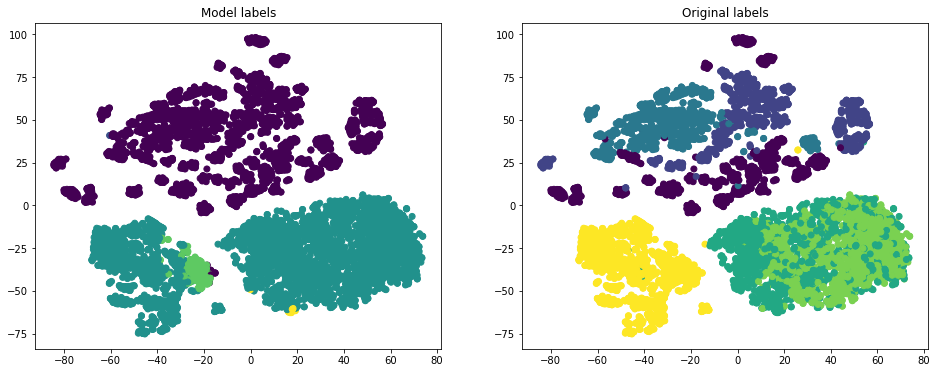

,WALKING,WALKING_UPSTAIRS,WALKING_DOWNSTAIRS,SITTING,STANDING,LAYING
0,1226.0,1073.0,984.0,1.0,0.0,11.0
1,0.0,0.0,2.0,0.0,0.0,0.0
2,0.0,0.0,0.0,1266.0,1374.0,1231.0
3,0.0,0.0,0.0,0.0,0.0,165.0
4,0.0,0.0,0.0,19.0,0.0,0.0


In [36]:
visulization_and_matrix(X_average)

Wnioski: nie za bardzo jest co powiedzieć. Generalnie widać, że wyszło słabo, jedyny słuszny jest zaaplikowany już wcześniej podział na 2 typy aktywności.

### Ward

In [37]:
visualization_3d(X_ward)

Wnioski: Przynajmniej w naszym odczuciu, wizualny podział jest dosyć apetyczny. Jak się zresztą przekonamy, będzie to jedyny model z aglomeracyjnych gdony rozważania jako ten finalny. Całkiem fajny podział na etykiety 0 i 1. Również fajny podział między etykietami 2 i 3 gdzie optycznie również można przejść płaszczyzną na wyskości około z = 1. Klaster 4 wydaje się rownież sensowny, cieżko mu wiele zarzucić bo wiedzimy tylko w 3 wymiarach nasze dane.

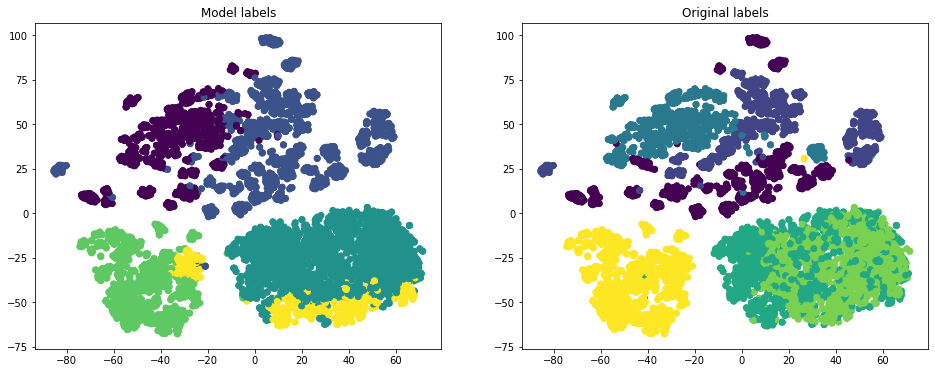

,WALKING,WALKING_UPSTAIRS,WALKING_DOWNSTAIRS,SITTING,STANDING,LAYING
0,350.0,114.0,818.0,0.0,0.0,0.0
1,876.0,959.0,168.0,1.0,0.0,11.0
2,0.0,0.0,0.0,1107.0,1140.0,1.0
3,0.0,0.0,0.0,8.0,0.0,1260.0
4,0.0,0.0,0.0,170.0,234.0,135.0


In [38]:
visulization_and_matrix(X_ward)

Wnioski: generalne problemy z rozróznieniem walking i walking upstaris. Aktywność laying została całkiem fajnie odseparowana. Klastrowi 4 jednak mogliśmy co nieco zarzucić. W confrusion matrix widać, że zwiera on podobną liczność obserwacji każdego typu. Podsumowując, względnie łatwo jest oddzielić walking downstairs i laying.

### Single

In [39]:
visualization_3d(X_single)

Wnioski: zapowiada się na dosyć słaby podział. Szczególnie rzucające się w oczy są niskie liczności pewnych podgrup.

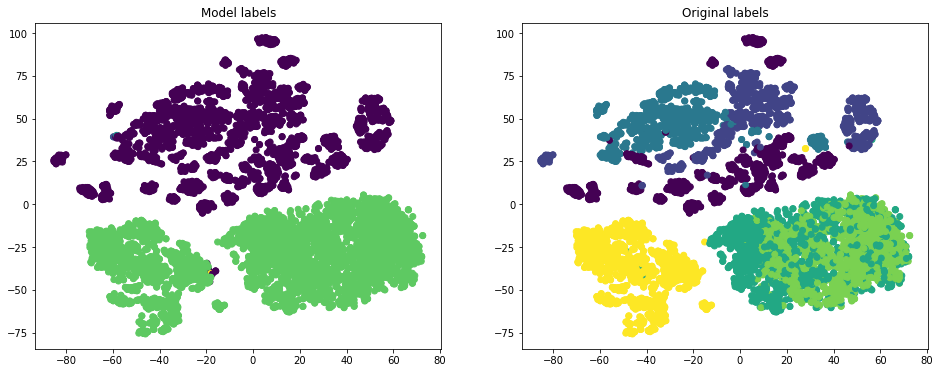

,WALKING,WALKING_UPSTAIRS,WALKING_DOWNSTAIRS,SITTING,STANDING,LAYING
0,1226.0,1073.0,983.0,1.0,0.0,11.0
1,0.0,0.0,2.0,0.0,0.0,0.0
2,0.0,0.0,1.0,0.0,0.0,0.0
3,0.0,0.0,0.0,1285.0,1374.0,1394.0
4,0.0,0.0,0.0,0.0,0.0,2.0


In [40]:
visulization_and_matrix(X_single)

Wnioski: Jak do 3d. Chyba nie ma co skupiać się bardziej na nierokujących modelach.

### Complete

In [41]:
visualization_3d(X_complete)

Wnioski: Nie wygląda to najlepiej, jednak jest pewna poprawa względem single.

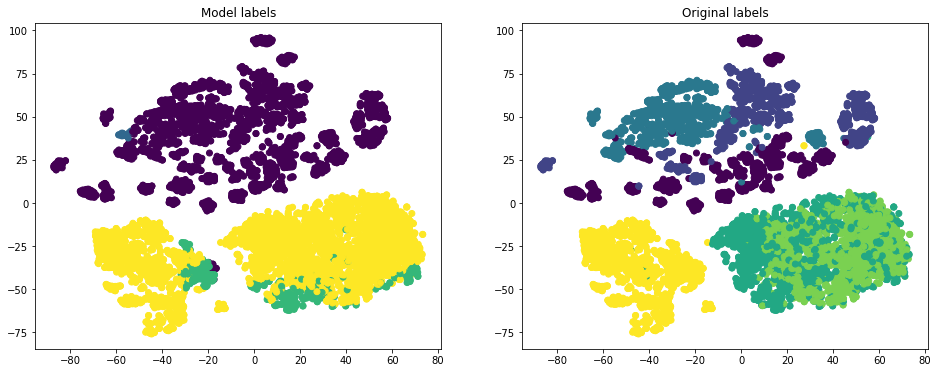

,WALKING,WALKING_UPSTAIRS,WALKING_DOWNSTAIRS,SITTING,STANDING,LAYING
0,1225.0,1073.0,964.0,1.0,0.0,11.0
1,1.0,0.0,22.0,0.0,0.0,0.0
2,0.0,0.0,0.0,159.0,88.0,155.0
3,0.0,0.0,0.0,1126.0,1286.0,1241.0


In [42]:
visulization_and_matrix(X_complete)

Wnioski: Zapowiadało się nienajlepiej i tak faktycznie jest. Nie traćmy czasu i lećmy do kolejnych modeli.

## GMM

### Liczba klastrów

In [43]:
from sklearn.mixture import GaussianMixture

def metryki_GMM(metryka, cluster_0, cluster_1, cluster_0_30, cluster_1_30):

    fig, axs = plt.subplots(2, 2, figsize=(15,15))
    cov_type = [["full", "tied"], ["diag", "spherical"]]
    
    for i in range(0, 2):
        for j in range(0, 2):
            wyniki0 = []
            wyniki1 = []
            for k in range(2,8):
                gmm = GaussianMixture(n_components=k, covariance_type=cov_type[i][j], random_state=2137)
                score = metryka(cluster_0, gmm.fit_predict(cluster_0_30))
                wyniki0.append(score)
                gmm = GaussianMixture(n_components=k, covariance_type=cov_type[i][j], random_state=2137)
                score = metryka(cluster_1, gmm.fit_predict(cluster_1_30))
                wyniki1.append(score)
            axs[j, i].plot(range(2, 8), wyniki0, 'bx-', label='cluster_0')
            axs[j, i].plot(range(2, 8), wyniki1, 'go-', label='cluster_1')
            axs[j, i].set_title('GMM' + cov_type[i][j])
            axs[j, i].legend(loc='upper right', fontsize=16)

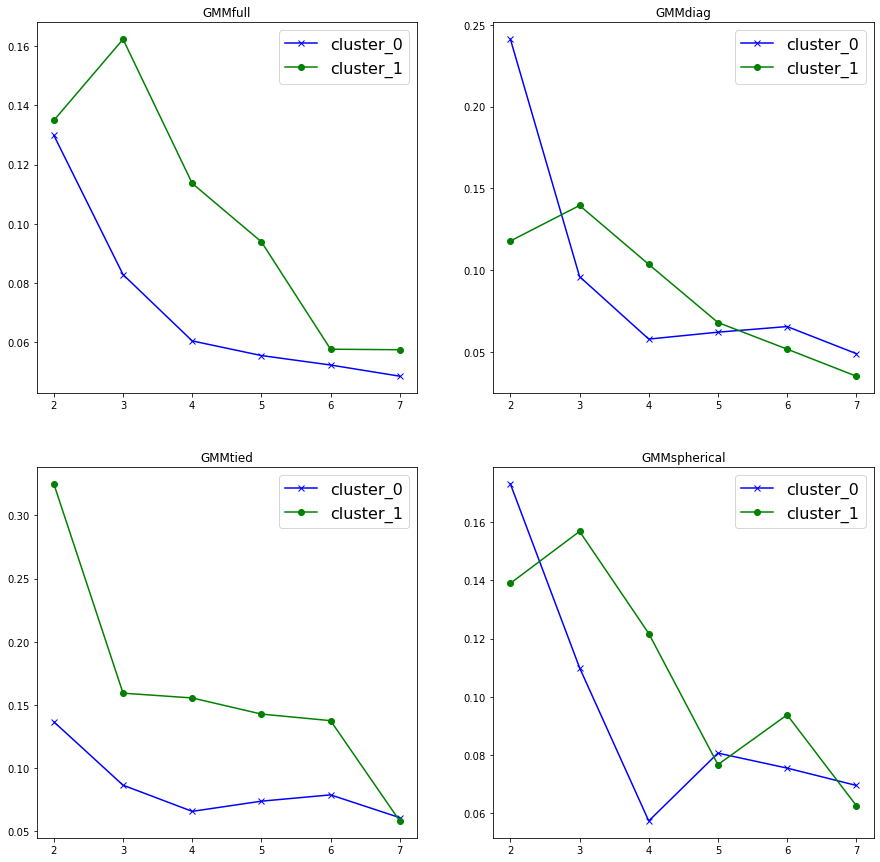

In [44]:
metryki_GMM(silhouette_score, cluster_0, cluster_1, cluster_0_30, cluster_1_30)

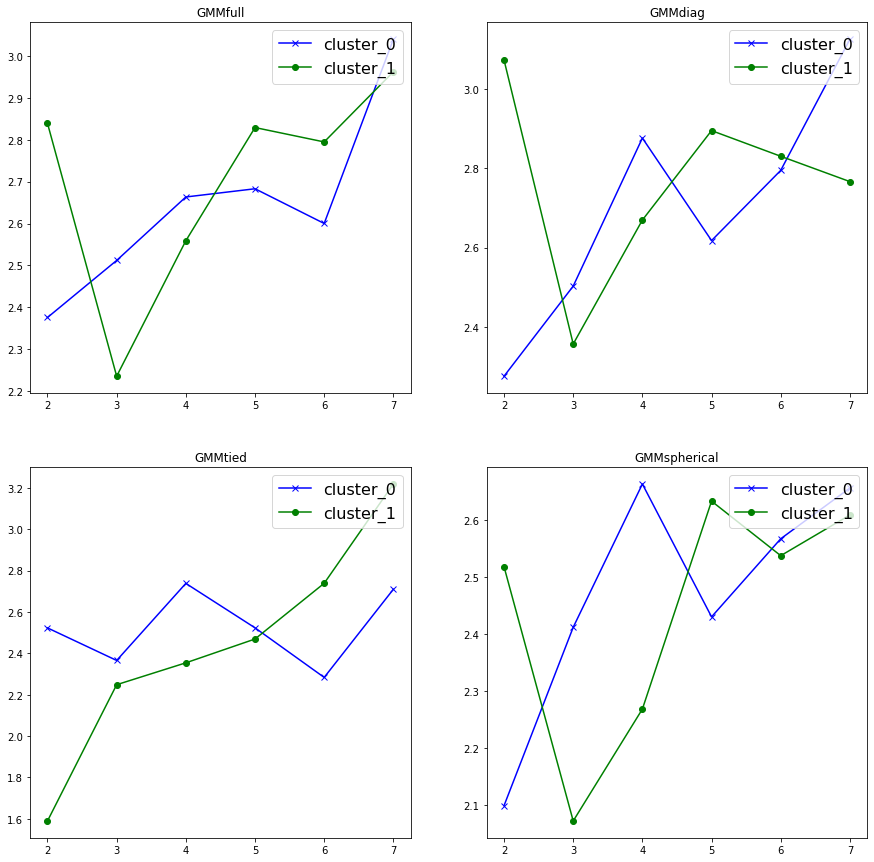

In [45]:
metryki_GMM(davies_bouldin_score, cluster_0, cluster_1, cluster_0_30, cluster_1_30)

Z metryk wnioskujemy, aby dokonać podziału na 2 dla każdej metody w obrębie "klastra 0" i na 3 w obrebie klastra "klastra 1" - z wyjątkiem tied, tam znów na 2.

### Tworzenie wyników

In [46]:
def etykietuj_GMM(liczba_klastrow_cluster_0, liczba_klastrow_cluster_1, conv_type):

    model = GaussianMixture(n_components=liczba_klastrow_cluster_0, covariance_type=conv_type)
    model.fit(cluster_0_30)
    shift_size = len(set(model.predict(cluster_0_30)))

    cluster_0_labeled = cluster_0
    cluster_0_labeled['Label'] = model.predict(cluster_0_30)

    model = GaussianMixture(n_components=liczba_klastrow_cluster_1, covariance_type=conv_type)
    model.fit(cluster_1_30)

    cluster_1_labeled = cluster_1
    cluster_1_labeled['Label'] = model.predict(cluster_1_30) + shift_size
    
    return cluster_0_labeled.append(cluster_1_labeled)

In [47]:
X_full = etykietuj_GMM(2, 3, "full")
X_tied = etykietuj_GMM(2, 2, "tied")
X_diag = etykietuj_GMM(2, 3, "diag")
X_spherical = etykietuj_GMM(2, 3, "spherical")

### Wizualizacja wyników w 3D

In [48]:
visualization_3d(X_full)

Tendencja tworzenia się 3 klastra łączącego zbiory w poziomie (kolor pomarańczowy) się utrzymała. Mimo że widzimy istniejącą płaszczyznę rozdzielającą w poziomie. 

In [49]:
visualization_3d(X_tied)

Ładnie oddzieliło po kolorach żółtym i pomarańczowym. Nie istnieje już tak wyraźna granica w zbiorach o labelkach 0 i 1. Poprzednio to odcięcie było wyraźniejsze, a teraz mamy pewne przenikanie. Może to być całkiem fajne, okaże się na końcu.

In [50]:
visualization_3d(X_diag)

Tutaj wnioski analogiczne do wyciaganych przy poprzenich przypadkach.

In [51]:
visualization_3d(X_spherical)

Tutaj również wnioski podobne. Możemy porównać sobie tutaj klastry 0 i 1 z tymi powyżej dla metody "diag". Zbiorki wydają się podobnie oddzielone - co innego pokaże confusion matrix.

### Wizualizacja wyników w 2D

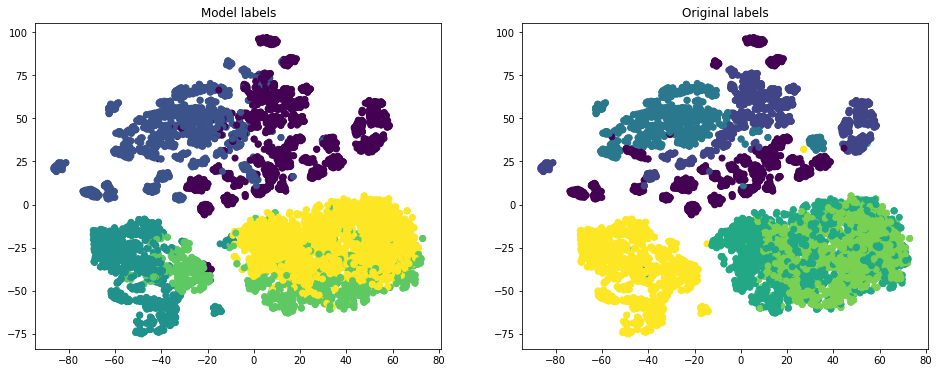

,WALKING,WALKING_UPSTAIRS,WALKING_DOWNSTAIRS,SITTING,STANDING,LAYING
0,897.0,791.0,94.0,1.0,0.0,11.0
1,329.0,282.0,892.0,0.0,0.0,0.0
2,0.0,0.0,0.0,40.0,0.0,1082.0
3,0.0,0.0,0.0,347.0,246.0,314.0
4,0.0,0.0,0.0,898.0,1128.0,0.0


In [52]:
visulization_and_matrix(X_full)

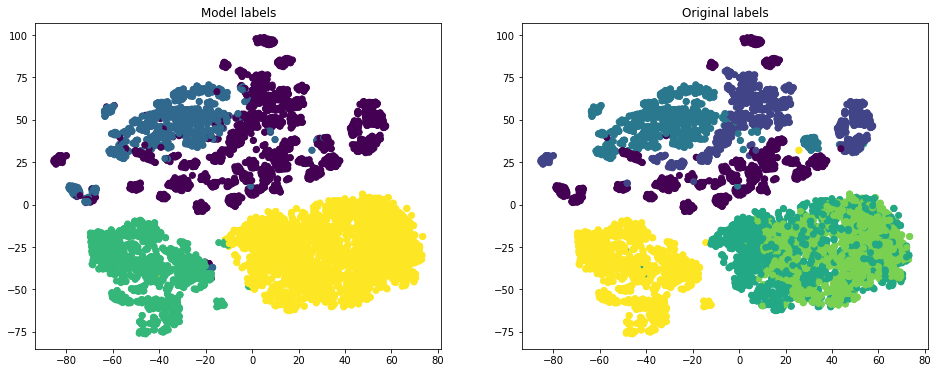

,WALKING,WALKING_UPSTAIRS,WALKING_DOWNSTAIRS,SITTING,STANDING,LAYING
0,1135.0,1056.0,104.0,1.0,0.0,4.0
1,91.0,17.0,882.0,0.0,0.0,7.0
2,0.0,0.0,0.0,17.0,0.0,1396.0
3,0.0,0.0,0.0,1268.0,1374.0,0.0


In [53]:
visulization_and_matrix(X_tied)

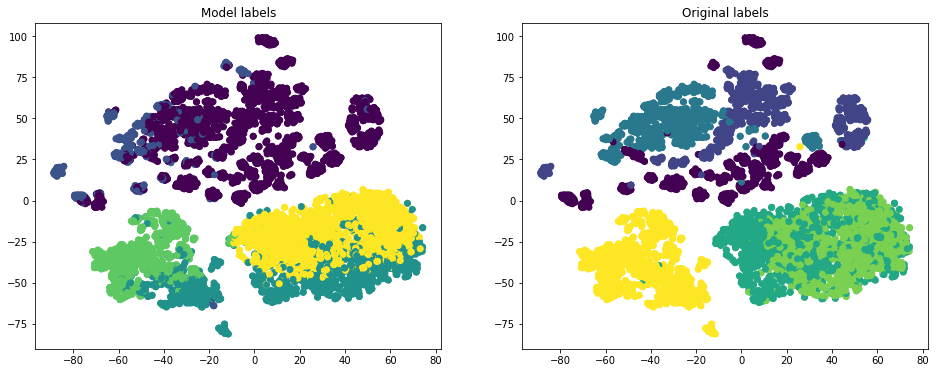

,WALKING,WALKING_UPSTAIRS,WALKING_DOWNSTAIRS,SITTING,STANDING,LAYING
0,1087.0,972.0,747.0,0.0,0.0,0.0
1,139.0,101.0,239.0,1.0,0.0,11.0
2,0.0,0.0,0.0,394.0,433.0,449.0
3,0.0,0.0,0.0,21.0,0.0,947.0
4,0.0,0.0,0.0,870.0,941.0,0.0


In [54]:
visulization_and_matrix(X_diag)

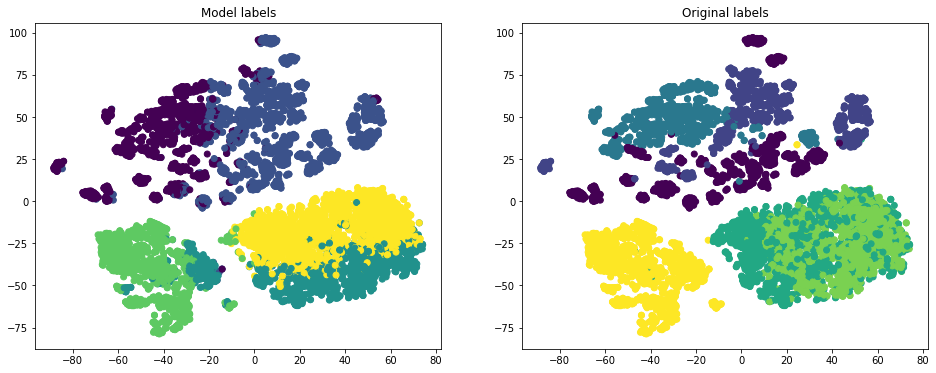

,WALKING,WALKING_UPSTAIRS,WALKING_DOWNSTAIRS,SITTING,STANDING,LAYING
0,375.0,194.0,728.0,0.0,0.0,1.0
1,851.0,879.0,258.0,1.0,0.0,10.0
2,0.0,0.0,0.0,396.0,486.0,229.0
3,0.0,0.0,0.0,51.0,0.0,1167.0
4,0.0,0.0,0.0,838.0,888.0,0.0


In [55]:
visulization_and_matrix(X_spherical)

Ogólne wnioski: jeśli już w obrębie klastrów udaje się coś oddzielić to głównie WALKING DOWNSATIRS i LAYING. Mimo, że dig dzielił wizualnie podobnie do spherical to na conf matrix widizmy, że diag słabo wyodrębnił klastry w aktywnościach dynamicznych zawierając wiele z każdego rodzaju.

## Birch

### Liczba klastrów

In [56]:
from sklearn.cluster import Birch

def metryki_Birch(metryka, cluster_0, cluster_1, cluster_0_30, cluster_1_30):
    wyniki0 = []
    wyniki1 = []

    for k in range(2,8):
        bir = Birch(n_clusters=k)
        score = metryka(cluster_0, bir.fit_predict(cluster_0_30))
        wyniki0.append(score)
        bir = Birch(n_clusters=k)
        score = metryka(cluster_1, bir.fit_predict(cluster_1_30))
        wyniki1.append(score)

    
    plt.figure(figsize=(12, 8))
    plt.plot(range(2, 8), wyniki0, 'bx-', label='cluster_0')
    plt.plot(range(2, 8), wyniki1, 'go-', label='cluster_1')
    plt.xlabel('k')
    plt.ylabel('Wartość metryki')
    plt.legend(loc='upper right', fontsize=16)
    plt.show()

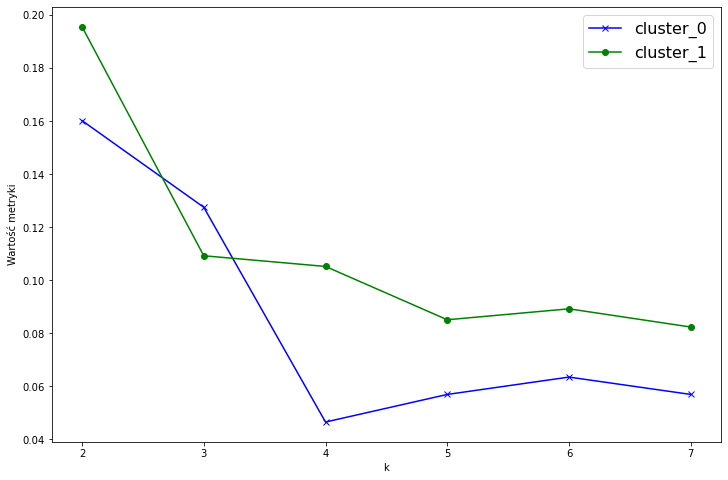

In [57]:
metryki_Birch(silhouette_score, cluster_0, cluster_1, cluster_0_30, cluster_1_30)

Metrka silhouette_score dla obu klastrów wskazuje, że kolejny podział będzie najlepszy na 2 klastry. Zobaczymy tak jak poprzednio, co wskaże jeszcze metryka davies_bouldin_score.

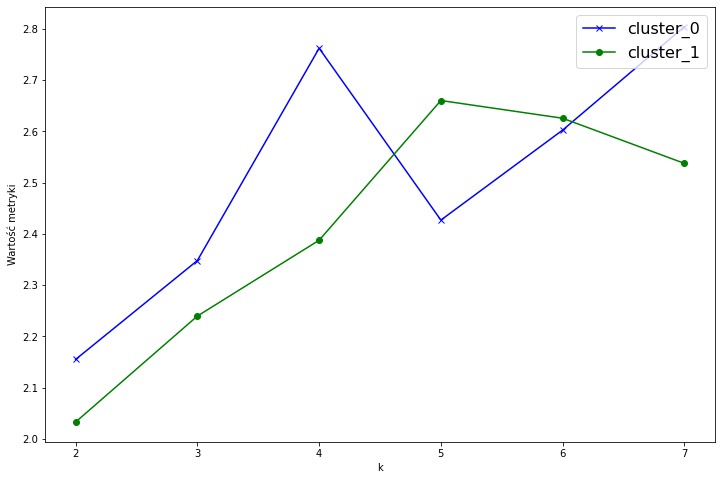

In [58]:
metryki_Birch(davies_bouldin_score, cluster_0, cluster_1, cluster_0_30, cluster_1_30)

Kolejna metryka wskazała dalszy podział na 2 klastry w obu przypadkach, dlatego takich podziałów dokonajmy.

### Tworzenie wyników

In [59]:
clusterer = Birch(n_clusters=2)
clusterer.fit(cluster_0_30)

cluster_00 = cluster_0.loc[clusterer.labels_ == 0]
cluster_00['Label'] = 0
cluster_01 = cluster_0.loc[clusterer.labels_ == 1]
cluster_01['Label'] = 1

In [60]:
clusterer = Birch(n_clusters=2)
clusterer.fit(cluster_1_30)

cluster_10 = cluster_1.loc[clusterer.labels_ == 0]
cluster_10['Label'] = 2
cluster_11 = cluster_1.loc[clusterer.labels_ == 1]
cluster_11['Label'] = 3

In [61]:
X_Birch = cluster_00.append(cluster_01).append(cluster_10).append(cluster_11)

### Wizualizacja wyników w 3D

In [62]:
visualization_3d(X_Birch)

### Wizualizacja wyników w 2D

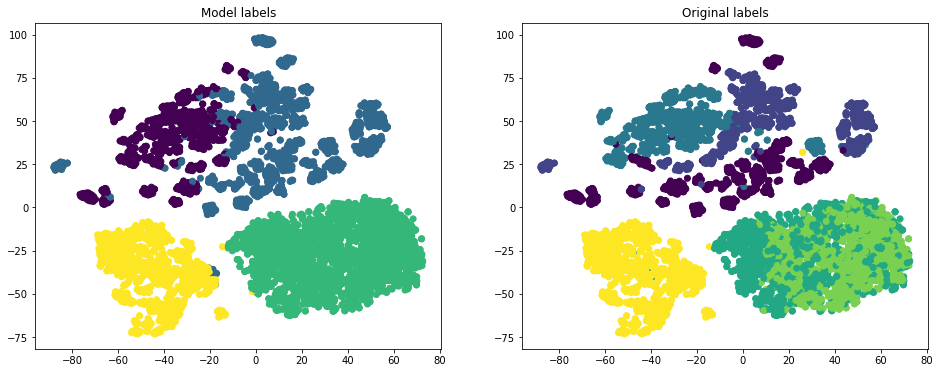

,WALKING,WALKING_UPSTAIRS,WALKING_DOWNSTAIRS,SITTING,STANDING,LAYING
0,350.0,114.0,818.0,0.0,0.0,0.0
1,876.0,959.0,168.0,1.0,0.0,11.0
2,0.0,0.0,0.0,1277.0,1374.0,1.0
3,0.0,0.0,0.0,8.0,0.0,1395.0


In [63]:
visulization_and_matrix(X_Birch)

# Na koniec 3d dla oryginalnych labeli

In [64]:
X_train_labled = X_train
Y_train = pd.read_csv("UCI HAR Dataset/train/Y_train.txt", delim_whitespace=True, header=None)
X_train_labled['Label'] = Y_train

In [65]:
visualization_3d(X_train_labled )

# Podsumowanie

Tutaj znajudje potwierdzenie intuicja, że te klastry dotyczące aktywności statycznych nie powinny "łączyć się w pionie", jednak każdy z zastosowanych algorytmów nie wyodrębnił tych klastrów w sposób pożądany. 

Przynajmniej w 3 wymiarach - klastry dotyczące aktywności dynamicznych mocno się przenikają. Być może więcej eksperymentów z GMM pozwoliłoby na osiągnięcie tutaj użytecznych wyników. 

Jako finalny model bez dostępu do etykiet i możliwości sprawdzenia wyników zdecydowalibyśmy się na KMeans. Dostarczał on do tego dobrych przesłanek optycznych i zachowanie się metryk też go popierało. Poza tym sposób działania algorytmu dawał (możliwe, że złudne, bo tego zakładać nie powinniśmy) poczucie bezpieczeństwa, że nie wpadniemy w coś totalnie złego przy tym zbiorze danych.